In [1]:
pip install mapclassify

Note: you may need to restart the kernel to use updated packages.


In [2]:
import matplotlib.pyplot as plt
from mapclassify import classify

In [3]:
import sys
import os
import numpy as np
import warnings
import geopandas as gpd
import folium

# path to folder to CityGeoTools
folder = "/Users/lizzy/Documents/ИТМО/Прикладные методы анализа ГД/Online/CityGeoTools-master"
sys.path.append(folder)

from metrics.data import CityInformationModel as BaseModel
from metrics.calculations import utils
warnings.simplefilter(action='ignore')

/Users/lizzy/Documents/ИТМО/Прикладные методы анализа ГД/Online/venv/lib/python3.9/site-packages/geopandas/_compat.py:123: UserWarning: The Shapely GEOS version (3.10.3-CAPI-1.16.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(


In [4]:
city_model = BaseModel.CityInformationModel(city_name="Miass", city_crs=32641, cwd="../")
city_model.update_layer("MobilityGraph", "/Users/lizzy/Documents/ИТМО/Прикладные методы анализа ГД/Online/CityGeoTools-master/notebook_examples/graph.graphml")

Validation of MobilityGraph layer...
MobilityGraph layer loaded successfully!


За точку отсчета 3-х изохрон был взят самый большой ТЦ в городе "Слон"

In [5]:
from metrics.calculations import mobility_analysis

point = [[55.046499, 60.109381]]  #55.049137, 60.116411
point = utils.request_points_project(point, set_crs=4326, to_crs=32641)[0]

if city_model.methods.if_method_available("mobility_analysis"):
    walk_accessibility_zone = mobility_analysis.AccessibilityIsochrones(city_model).get_accessibility_isochrone(
        travel_type="walk",
        x_from=point[0], 
        y_from=point[1],
        weight_type = "time_min",
        weight_value = 10)
    walk_isochrone = gpd.GeoDataFrame.from_features(walk_accessibility_zone["isochrone"]).set_crs(4326)

if city_model.methods.if_method_available("mobility_analysis"):
    public_accessibility_zone = mobility_analysis.AccessibilityIsochrones(city_model).get_accessibility_isochrone(
        travel_type="public_transport",
        x_from=point[0], 
        y_from=point[1],
        weight_type = "time_min",
        weight_value = 20)
    public_isochrone = gpd.GeoDataFrame.from_features(public_accessibility_zone["isochrone"]).set_crs(4326)

if city_model.methods.if_method_available("mobility_analysis"):
    drive_accessibility_zone = mobility_analysis.AccessibilityIsochrones(city_model).get_accessibility_isochrone(
        travel_type="drive",
        x_from=point[0], 
        y_from=point[1],
        weight_type = "time_min",
        weight_value = 5)
    drive_isochrone = gpd.GeoDataFrame.from_features(drive_accessibility_zone["isochrone"]).set_crs(4326)

In [6]:
walk_isochrone.head()

,geometry,travel_type,weight_type,weight_value
0,"POLYGON ((60.10958 55.04216, 60.10744 55.04242...",Пешком,time_min,10


In [7]:
tooltip = folium.GeoJsonTooltip(
    fields=["travel_type", "weight_type", "weight_value"],
    aliases=["travel_type", "weight_type", "weight_value"],
    style="""
        background-color: #F0EFEF;
        border: 2px solid black;
        border-radius: 3px;
        box-shadow: 3px;
    """,
    max_width=800,
)

In [8]:
map = folium.Map(location = [55.046499, 60.109381], zoom_start = 15, tiles='CartoDB positron')
folium.GeoJson(data=walk_isochrone, style_function=lambda x: {'fillColor': 'green'}, tooltip=tooltip).add_to(map)
folium.Marker([55.046499, 60.109381]).add_to(map)
map

In [9]:
map = folium.Map(location = [55.046499, 60.109381], zoom_start = 15, tiles='CartoDB positron')
folium.GeoJson(data=public_isochrone, style_function=lambda x: {'fillColor': 'orange'}, tooltip=tooltip).add_to(map)
folium.Marker([55.046499, 60.109381]).add_to(map)
map

In [10]:
map = folium.Map(location = [55.046499, 60.109381], zoom_start = 15, tiles='CartoDB positron')
folium.GeoJson(data=drive_isochrone, style_function=lambda x: {'fillColor': 'blue'}, tooltip=tooltip).add_to(map)
folium.Marker([55.046499, 60.109381]).add_to(map)
map

In [11]:
maps = folium.Map(location = [55.046499, 60.109381], zoom_start = 15, tiles='CartoDB positron')
folium.GeoJson(data=walk_isochrone, style_function=lambda x: {'fillColor': 'green'}).add_to(maps)
folium.GeoJson(data=public_isochrone, style_function=lambda x: {'fillColor': 'orange'}).add_to(maps)
folium.GeoJson(data=drive_isochrone, style_function=lambda x: {'fillColor': 'blue'}).add_to(maps)
folium.Marker([55.046499, 60.109381]).add_to(maps)
maps

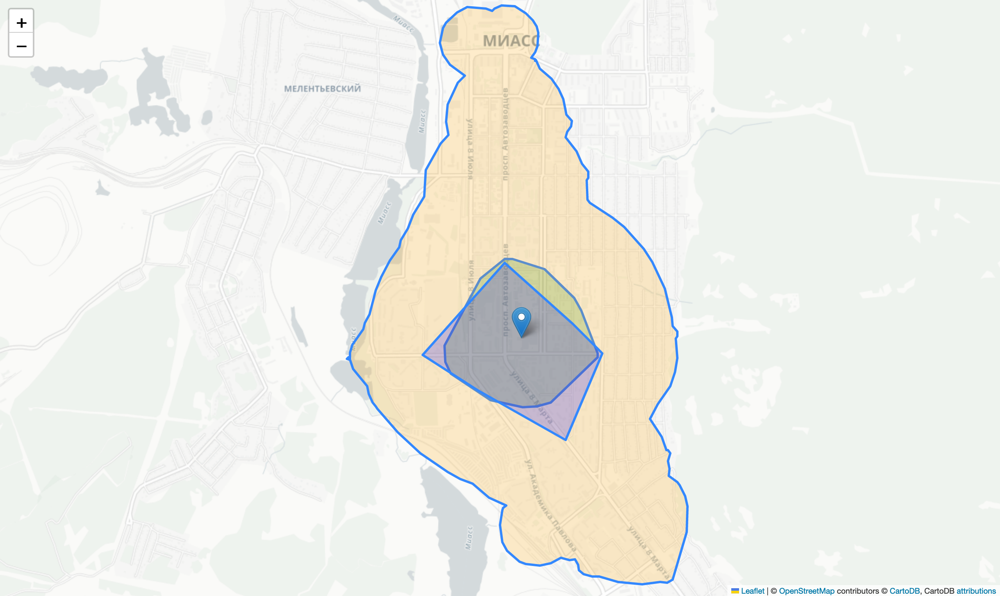

In [12]:
from IPython.display import Image, display
display(Image(filename='/Users/lizzy/Documents/ИТМО/Прикладные методы анализа ГД/Online/CityGeoTools-master/notebook_examples/map.png', embed=True))

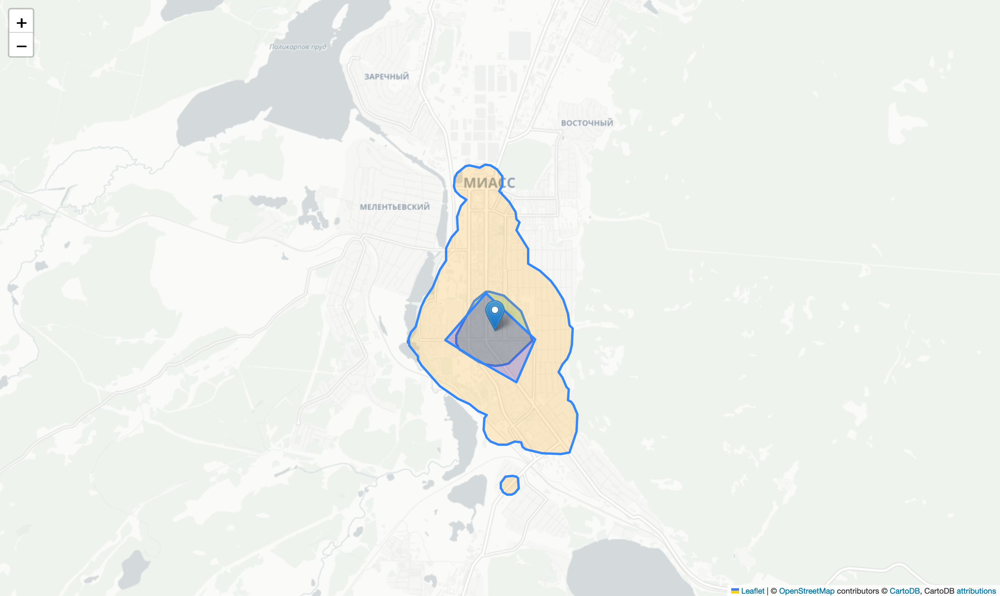

In [13]:
from IPython.display import Image, display
display(Image(filename='/Users/lizzy/Documents/ИТМО/Прикладные методы анализа ГД/Online/CityGeoTools-master/notebook_examples/map2.png', embed=True))

Определение зданий, попадающих в изохроны

In [14]:
import geopandas as gpd
from shapely.geometry import Point

In [15]:
gdf = gpd.read_file('/Users/lizzy/Documents/ИТМО/Прикладные методы анализа ГД/Online/Clusters/building2.geojson')

# Создание столбцов для каждого полигона в жилых домах с проверкой на попадание в каждую изохрону
gdf['walk_isochrone'] = gdf['geometry'].within(walk_isochrone.unary_union)
gdf['public_isochrone'] =gdf['geometry'].within(public_isochrone.unary_union)
gdf['drive_isochrone'] = gdf['geometry'].within(drive_isochrone.unary_union)

# Создание нового GeoDataFrame с информацией о жилых домах и их принадлежности к полигонам
result_gdf = gdf[['id', 'walk_isochrone', 'public_isochrone', 'drive_isochrone', 'geometry', 'is_living' ]]
result_gdf.to_file('isochones_building.geojson', driver='GeoJSON')

In [16]:
result_gdf.head(10)

,id,walk_isochrone,public_isochrone,drive_isochrone,geometry,is_living
0,1307317,False,False,False,"MULTIPOLYGON (((60.15339 55.14542, 60.15339 55...",False
1,1307331,False,False,False,"MULTIPOLYGON (((60.15119 55.14332, 60.15117 55...",False
2,1335742,False,True,False,"MULTIPOLYGON (((60.11683 55.05017, 60.11683 55...",False
3,1336095,False,True,False,"MULTIPOLYGON (((60.11033 55.04124, 60.11024 55...",False
4,3028315,False,True,False,"MULTIPOLYGON (((60.10837 55.06308, 60.10837 55...",False
5,3089118,False,True,False,"MULTIPOLYGON (((60.10464 55.06643, 60.10475 55...",False
6,3089119,False,True,False,"MULTIPOLYGON (((60.10464 55.06643, 60.10475 55...",False
7,3444414,True,True,True,"MULTIPOLYGON (((60.11042 55.04788, 60.11042 55...",False
8,3878462,False,True,False,"MULTIPOLYGON (((60.11466 55.03565, 60.11461 55...",True
9,3878463,False,True,False,"MULTIPOLYGON (((60.11485 55.03569, 60.11422 55...",False


In [18]:
result_gdf.explore(tiles = "CartoDB positron")